# Cohort analysis for optimizing marketing expenses

## Intro

My name is Alon Istacharov and I'm an intern at the analytical department at Yandex.Afisha. My task is to help optimize marketing expenses.

We have:
- Server logs with data on Yandex.Afisha visits from June 2017 through May 2018
- Dump file with all orders for the period
- Marketing expenses statistics

We are going to study:
- How people use the product
- When they start to buy
- How much money each customer brings
- When they pay off

**Description of the data**

The visits table (server logs with data on website visits):
- Uid — user's unique identifier
- Device — user's device
- Start Ts — session start date and time
- End Ts — session end date and time
- Source Id — identifier of the ad source the user came from

All dates in this table are in YYYY-MM-DD format.

The orders table (data on orders):
- Uid — unique identifier of the user making an order
- Buy Ts — order date and time
- Revenue — Yandex.Afisha's revenue from the order

The costs table (data on marketing expenses):
- source_id — ad source identifier
- dt — date
- costs — expenses on this ad source on this day

<h2>Tables Of Contents <a class="anchor" id="table_of_contents"></a></h2>

- [1. Prepare the data](#prepare)
- [2. Make reports and calculate metrics](#metrics)
 - [Product](#product)
 - [Sales](#sales)
 - [Marketing](#marketing)
- [3. General conclusion & recommendations](#reco)

## Download the data and prepare it for analysis

<a class="anchor" id="prepare"></a>
[Go back to the Table of Contents](#table_of_contents)

Install plotly

In [1]:
#!pip install -Uq plotly

Import necessary libraries.

In [2]:
import pandas as pd
import numpy as np
import datetime as dt
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

Load the data files into suitable variables.

**Note:** Some study of the datasets parameters was done "behind the scenes", meaning it will not be displayed in this notebook, the idea behind this is to load optimized data to the variables to save memory and compute time.

In [3]:
try:
    visits = pd.read_csv('visits_log_us.csv', dtype={'Device': 'category'}, parse_dates=['Start Ts', 'End Ts'])
    orders = pd.read_csv('orders_log_us.csv', parse_dates=['Buy Ts'])
    costs = pd.read_csv('costs_us.csv', parse_dates=['dt'])
except:
    visits = pd.read_csv('/datasets/visits_log_us.csv', dtype={'Device': 'category'}, parse_dates=['Start Ts', 'End Ts'])
    orders = pd.read_csv('/datasets/orders_log_us.csv', parse_dates=['Buy Ts'])
    costs = pd.read_csv('/datasets/costs_us.csv', parse_dates=['dt'])

Let's take a general look at the datasets.

Print the first 5 rows of each dataframe.

In [4]:
visits.head()

,Device,End Ts,Source Id,Start Ts,Uid
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214
4,desktop,2017-12-27 14:06:00,3,2017-12-27 14:06:00,9969694820036681168


In [5]:
orders.head()

,Buy Ts,Revenue,Uid
0,2017-06-01 00:10:00,17.00,10329302124590727494
1,2017-06-01 00:25:00,0.55,11627257723692907447
2,2017-06-01 00:27:00,0.37,17903680561304213844
3,2017-06-01 00:29:00,0.55,16109239769442553005
4,2017-06-01 07:58:00,0.37,14200605875248379450


In [6]:
costs.head()

,source_id,dt,costs
0,1,2017-06-01,75.20
1,1,2017-06-02,62.25
2,1,2017-06-03,36.53
3,1,2017-06-04,55.00
4,1,2017-06-05,57.08


Right off the bat, we can notice the columns names of visits & orders dataframes contain uppercase letters and spaces, this is a bad practice and we'll address this issue later.

Now, let's validate that each column in each of the dataframes has the correct data type.

In [7]:
visits.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 359400 entries, 0 to 359399
Data columns (total 5 columns):
 #   Column     Non-Null Count   Dtype         
---  ------     --------------   -----         
 0   Device     359400 non-null  category      
 1   End Ts     359400 non-null  datetime64[ns]
 2   Source Id  359400 non-null  int64         
 3   Start Ts   359400 non-null  datetime64[ns]
 4   Uid        359400 non-null  uint64        
dtypes: category(1), datetime64[ns](2), int64(1), uint64(1)
memory usage: 11.3 MB


In [8]:
orders.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50415 entries, 0 to 50414
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype         
---  ------   --------------  -----         
 0   Buy Ts   50415 non-null  datetime64[ns]
 1   Revenue  50415 non-null  float64       
 2   Uid      50415 non-null  uint64        
dtypes: datetime64[ns](1), float64(1), uint64(1)
memory usage: 1.2 MB


In [9]:
costs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2542 entries, 0 to 2541
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   source_id  2542 non-null   int64         
 1   dt         2542 non-null   datetime64[ns]
 2   costs      2542 non-null   float64       
dtypes: datetime64[ns](1), float64(1), int64(1)
memory usage: 59.7 KB


Check for missing values in the data:

In [10]:
print('Missing values in visits date frame:  {}'.format(visits.isnull().sum()))
print('')
print('Missing values in orders date frame: {}'.format(orders.isnull().sum()))
print('')
print('Missing values in costs date frame: {}'.format(costs.isnull().sum()))

Missing values in visits date frame:  Device       0
End Ts       0
Source Id    0
Start Ts     0
Uid          0
dtype: int64

Missing values in orders date frame: Buy Ts     0
Revenue    0
Uid        0
dtype: int64

Missing values in costs date frame: source_id    0
dt           0
costs        0
dtype: int64


As we can above, all columns have the correct data types, moreover, there are no missing values in any of the dataframes.

Now, let's change the columns names of visits and orders to lowercase letters and according to python conventions.

In [11]:
visits.columns = ['device', 'end_ts', 'source_id', 'start_ts', 'uid']
orders.columns = ['buy_ts', 'revenue', 'uid']

Let's check if there are duplicates in any of the dataframes.

In [12]:
print('The number of duplicates in visits df is {}'.format(visits.duplicated().sum()))
print('The number of duplicates in orders df is {}'.format(orders.duplicated().sum()))
print('The number of duplicates in costs df is {}'.format(costs.duplicated().sum()))

The number of duplicates in visits df is 0
The number of duplicates in orders df is 0
The number of duplicates in costs df is 0


No duplicates found.

Let's add date, week, month, and year columns to visits and orders dataframes, this step will allow us to analyze cohorts later in the project.

In [13]:
#visits dataframe

#month of visit
visits['month_visit'] = visits['start_ts'].astype('datetime64[M]')
#week of visit
visits['week_visit']  = visits['start_ts'].astype('datetime64[W]')
#date of visit
visits['date_visit'] = pd.to_datetime(visits['start_ts'].dt.date)

#orders dataframe

#month of purchase
orders['month_purchase'] = orders['buy_ts'].astype('datetime64[M]')
#week of purchase
orders['week_purchase']  = orders['buy_ts'].astype('datetime64[W]')
#date of purchase
orders['date_purchase'] = pd.to_datetime(orders['buy_ts'].dt.date)

### Conclusion

To conclude, at first we loaded the data files in an optimized way into suitable variables:

- 'Device' column in visits dataframe was converted to 'category' data type as there is a limited number of unique values in the column.
- Columns that represent dates values in every dataframe were converted to DateTime datatype.

This step allowed us to save space in terms of memory usage and convert columns to the correct data types for analysis in further stages.

Next, we took a general look at the data frames using head() method, we discovered that some columns names in visits and orders data frames contain uppercase letters and spaces, as we already know this is a bad practice, we changed these columns names to lowercase letters and replaced space with an underscore to comply with python programming conventions.

We didn't find any missing values/duplicates in any of the data frames.

Lastly, we made new columns for visits and orders data frames that represent the year, month, week, and date(without hours/minutes/seconds) for each visit/order. This step will allow us to do cohort analysis in further stages.

## Make reports and calculate metrics

<a class="anchor" id="metrics"></a>
[Go back to the Table of Contents](#table_of_contents)

At this stage, we'll answer several questions regarding the product/sales/marketing of Yandex.Afisha.

### Product

<a class="anchor" id="product"></a>
[Go back to the Table of Contents](#table_of_contents)

**How many people use it every day, week, and month?**

*Daily active users:*

In [14]:
#calculate how many unique users use the app in a day
dau = visits.groupby(visits['date_visit'])['uid'].nunique().reset_index()
#rename columns
dau.columns = ['date_visit', 'users_count']

#print first 5 rows of dau
dau.head()

,date_visit,users_count
0,2017-06-01,605
1,2017-06-02,608
2,2017-06-03,445
3,2017-06-04,476
4,2017-06-05,820


Using describe() method to get basic statiscal information of daily active users.

In [15]:
dau.describe().T

,count,mean,std,min,25%,50%,75%,max
users_count,364.0,907.991758,370.513838,1.0,594.0,921.0,1173.0,3319.0


Now, let's plot a lineplot to showcase the distribution of daily active users.

In [16]:
#create a line plot using plotly.express
fig = px.line(dau, x='date_visit', y='users_count',
              labels={
                  'date_visit': 'Date',
                  'users_count': 'Number of users'
              },title='Daily Active Users')

#add reference horizontal line with average DAU over time
fig.add_hline(y = dau['users_count'].mean(), line_dash='dash', line_color='orange', annotation_text='average DAU',
             annotation_position='top left')
fig.show()

Insights about DAU:

- The average number of daily users is 907.


- The median number of daily users is 921.


- From June to September we can notice a relatively small number of daily active users compared to the following months.


- The period From October to March can be addressed as the 'busier dates' where the number of daily active users is above the average, notice the peak on Nov 24, 2017, perhaps the app offered limited-time sales on tickets or did something else to attract more users than normal.


- Towards the end of March and after we can notice a decrease in the number of daily active users.


- On March 31, 2018, we had only 1 active user, definitely strange, perhaps on this particular date, something went wrong with the app, probably a technical issue that prevented from users using the app.

Overall it seems like seasonality affects the number of daily active users, in the winter people tend to spend more time in indoor activities as opposed to the summer when they tend to prefer outdoor activities, moreover, in the winter we have the holiday season, people have more free time and they are more likely to spend more time at activities like watching movies/go to a show and etc.

*Weekly active users:*

In [17]:
#calculate how many unique users use the app in a week
wau = visits.groupby(visits['week_visit'])['uid'].nunique().reset_index()
#rename columns
wau.columns = ['week_visit', 'users_count']

#print first 5 rows of wau
wau.head()

,week_visit,users_count
0,2017-06-01,4082
1,2017-06-08,3311
2,2017-06-15,2844
3,2017-06-22,3079
4,2017-06-29,3055


Using describe() method to get basic statiscal information weekly active users.

In [18]:
wau.describe().T

,count,mean,std,min,25%,50%,75%,max
users_count,53.0,5724.415094,2096.119936,1997.0,4056.0,5894.0,7441.0,10716.0


Now, let's plot a lineplot to showcase the distribution of weekly active users.

In [19]:
#create a line plot using plotly.express
fig = px.line(wau, x='week_visit', y='users_count',
              labels={
                  'week_visit': 'Week',
                  'users_count': 'Number of users'
              },title='Weekly Active Users')

#add reference horizontal line with average WAU over time
fig.add_hline(y = wau['users_count'].mean(), line_dash='dash', line_color='orange', annotation_text='average WAU',
             annotation_position='top left')
fig.show()

*Monthly active users:*

In [20]:
#calculate how many unique users use the app in a month
mau = visits.groupby(visits['month_visit'])['uid'].nunique().reset_index()
#rename columns
mau.columns = ['month_visit', 'users_count']

#print first 5 rows of mau
mau.head()

,month_visit,users_count
0,2017-06-01,13259
1,2017-07-01,14183
2,2017-08-01,11631
3,2017-09-01,18975
4,2017-10-01,29692


Using describe() method to get basic statiscal information of monthly active users.

In [21]:
mau.describe().T

,count,mean,std,min,25%,50%,75%,max
users_count,12.0,23228.416667,7546.380462,11631.0,17777.0,24240.5,28984.75,32797.0


Now, let's plot a bar plot to showcase the distribution of monthly active users.

In [22]:
#create a bar plot using plotly.express
fig = px.bar(mau, x='month_visit', y='users_count',
              labels={
                  'month_visit': 'Month',
                  'users_count': 'Number of users'
              },title='Monthly Active Users')

#add reference horizontal line with average overall MAU
fig.add_hline(y = mau['users_count'].mean(), line_dash='dash', line_color='orange', annotation_text='average MAU',
             annotation_position='top left')
fig.show()

Insight about WAU and MAU:
- WAU average is 5,724 and the median is 5,894.


- MAU average is 23,228 and the median is 24,240.

Overall these graphs(WAU & MAU) confirm the conclusions we came up with at the DAU section, user activity in the period we have our data is affected by seasonality, notice that the months we determined to be the 'busier periods' are above the average in terms of monthly active users and the rest are below.

**How many sessions are there per day? (One user might have more than one session.):**

Let's calculate the total number of visits in a day from the original visits data frame, and create a new data frame that will contain the number of unique users, number of sessions, and session per user according to date.

In [23]:
#calculate how many session occur in a day
sessions_per_day = visits.groupby(visits['date_visit'])['uid'].count().reset_index()
#rename columns
sessions_per_day.columns = ['date_visit', 'sessions_count']
#merge dau and session_per_day on 'date' column to create dau_new
dau_new = dau.merge(sessions_per_day, on='date_visit')
#create session_per_user column
dau_new['sessions_per_user'] = dau_new['sessions_count'] / dau_new['users_count']

#print first 5 rows of dau_new
dau_new.head()

,date_visit,users_count,sessions_count,sessions_per_user
0,2017-06-01,605,664,1.097521
1,2017-06-02,608,658,1.082237
2,2017-06-03,445,477,1.071910
3,2017-06-04,476,510,1.071429
4,2017-06-05,820,893,1.089024


Let's take a look at the distribution of sessions per user over time.

In [24]:
#create a line plot using plotly.express
fig = px.line(dau_new, x='date_visit', y='sessions_per_user',
              labels={
                  'date_visit': 'Date',
                  'sessions_per_user': 'Number of sessions per user'
              },title='Sessions per user')

fig.show()

As we can see above there isn't a lot of variability in terms of the number of sessions per user, the majority of users have 1.05 to 1.15 sessions per day.

From this information we can deduce that users don't enter the app more than 1 or 2 times a day, overall it makes sense since the goal of the app is to order tickets for events, an activity which most people do not repeat more than 2 times a day.

Now, let's compare between the number of daily active users per day to the number of sessions per day overtime.

In [25]:
#plot two line graps, one for dau and one for spu(sessios_per_user)
fig = go.Figure()
#lineplot for dau
fig.add_trace(go.Scatter(x=dau_new['date_visit'], y=dau_new['users_count'], 
                         mode='lines', name='DAU', line = dict(color='blue', width=2 ))
)

#lineplot for spu
fig.add_trace(go.Scatter(x=dau_new['date_visit'], y=dau_new['sessions_count'], 
                         mode='lines', name='SPU', line = dict(color='green', width=2 ))
)

#set layout
fig.update_layout(showlegend=True, 
                  plot_bgcolor="light gray", 
                  margin=dict(t=10,l=10,b=10,r=10)
)

fig.show()

As expected, the sessions per user graph behave exactly like the DAU graph but with slightly higher values.

**What is the length of each session?:**

First, let's add 'session_duration' column to the visits data frame.

In [26]:
#create session duration in minutes column
visits['session_duration'] = (visits['end_ts'] - visits['start_ts']).dt.seconds / 60

Let's get some basic statistical information about the 'session_duration' column with the describe() method.

In [27]:
visits['session_duration'].describe()

count    359400.000000
mean         10.725108
std          16.938913
min           0.000000
25%           2.000000
50%           5.000000
75%          14.000000
max        1408.000000
Name: session_duration, dtype: float64

Already we can notice some anomalies in the data, maximum value of 1408 minutes, session duration of 0 (minimum value),
mean value is significantly higher than the median which suggest that we got here right skewd distribution. 

Let's plot a histogram to get better understanding of the session length distribution.

In [28]:
#create a line plot using plotly.express
fig = px.histogram(visits, x='session_duration', nbins=150, color='device',
              labels={'session_duration': 'Session duration in minutes'},
              title='Sessions length distribution')

fig.show()

As expected, the distribution is heavily right skewd, notice the large outliers that skew our data, values above 100-200 minutes for one session are very odd and we need to slice the data to get rid of these outliers so we can draw accurate conclusions from the graph.

**Note:** The extreme values of session duration(those above 100 for example) are all from 'desktop' device, perhaps some users left their computers unattended for hours with their browser open on the app so the session length recorded by the app is significantly longer than the actual session duration.  

Let's slice the data and plot the histogram again.

In [29]:
#calculate outliers limits using numpy
Q1 = np.quantile(visits['session_duration'], 0.25)
Q3 = np.quantile(visits['session_duration'], 0.75)

#interquartile range
IQR = Q3 - Q1

#set limit for session duration
bottom_limit = Q1 - (1.5 * IQR)
upper_limit = Q3 + (1.5 * IQR)

#create a line plot using plotly.express
fig = px.histogram(visits.query('@bottom_limit <= session_duration <= @upper_limit'), x='session_duration',
                   nbins=50, color='device',
              labels={'session_duration': 'Session duration in minutes'},
              title='Sessions length distribution')

fig.show()


In [30]:
#basic statistical info with the sliced data
visits.query('@bottom_limit <= session_duration <= @upper_limit')['session_duration'].describe()

count    334742.000000
mean          7.421007
std           7.947895
min           0.000000
25%           1.000000
50%           4.000000
75%          11.000000
max          32.000000
Name: session_duration, dtype: float64

Now we can get a lot more informaton from the histogram compared to the previous one, the distribution is still right skewd obviously.

Key insights:
- The majority of users use the desktop app, other than that the distribution of desktop and touch devices is similar.
- The distribution of session duration in minutes is heavily right skewd.
- The vast majority of sessions durations are less 10 minutes.
- Its safe to say that in most cases users session length won't pass the 5 minute mark.

Let's plot a bar chart to see the average session duration by months.

In [31]:
#create a table with average session duration time for each month
monthly_session_len = visits.query(
        '@bottom_limit <= session_duration <= @upper_limit'
        ).groupby('month_visit')['session_duration'].mean().reset_index()

#create a bar plot using plotly.express
fig = px.bar(monthly_session_len, x='month_visit', y='session_duration',
              labels={
                  'month_visit': 'Month',
                  'session_duration': 'Average session duration'
              },title='Average Session Duration by Months')

fig.show()

No significant differences found between months in terms of average session duration time.

**How often do users come back?:**

Here we're asked to show retention rates of the app's users. Earlier we saw that user activity is affected by seasonality, so we'll do cohort analysis based on the months users used the app.

First, let's find the first visit of each users and store these values in a new column 'first_visit'.

In [32]:
#find the first visit for each user
first_visit = visits.groupby(['uid'])['date_visit'].min().reset_index()
#change columns names
first_visit.columns = ['uid', 'first_visit']

#merge to the visits dataframe
visits = visits.merge(first_visit, how='inner',on=['uid'])

Now, in order to do split the users to the right cohort, let's create two new columns to visits df, one will represent the cohort month(which month a certain user used the app for the first time) and the other one the cohort lifetime(how many months passed since the first month use).

In [33]:
#month of first visit
visits['first_visit_month'] = visits['first_visit'].astype('datetime64[M]')
#number of months passed since first month visit
visits['cohort_lifetime'] = ((pd.to_datetime(visits['date_visit']) - pd.to_datetime(visits['first_visit'])) / np.timedelta64(1,'M'))\
                                                                        .round().astype('int')

Let's group the data by cohort and lifetime and find the number of active users at a certain lifetime week for each cohort

In [34]:
cohorts = (
    visits.groupby(['first_visit_month', 'cohort_lifetime'])
    .agg({'uid': 'nunique'})
    .reset_index()
)

To calculate the retention rate, we first need to retrieve the initial number of users in a cohort and divide it by the number of users for each subsequent month.
Let's find the initial number of users in the cohort by looking at the 0th month:

In [35]:
initial_users_count = cohorts[cohorts['cohort_lifetime'] == 0][
    ['first_visit_month', 'uid']
]
#rename column name
initial_users_count = initial_users_count.rename(
    columns={'uid': 'cohort_users'}
) 

Let's merge the data on cohorts with the initial number of users in the cohort, then calculate the retention rate.

In [36]:
#merge the data on cohorts with the initial number of users in the cohort
cohorts = cohorts.merge(initial_users_count, on='first_visit_month')

#divide the number of active users in each month by the initial number of users in the cohort
cohorts['retention'] = cohorts['uid'] / cohorts['cohort_users']

Now we compile a pivot table and make a heatmap.

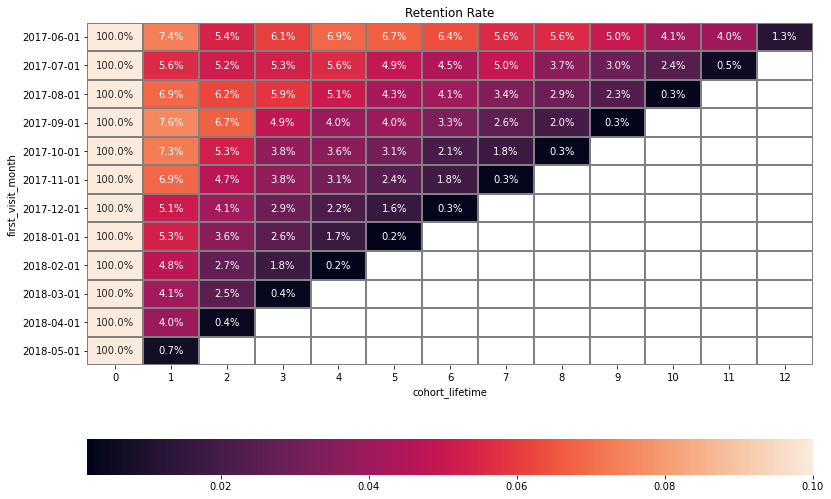

In [37]:
#create a pivot table with cohorts as rows, cohort liftime as columns and retention as the values.
retention_pivot = cohorts.pivot_table(
    index='first_visit_month',
    columns='cohort_lifetime',
    values='retention',
    aggfunc='sum',
)

#set heatmap size and title
plt.figure(figsize=(13, 9))
plt.title('Retention Rate')

#change index annotation to a nicer format
retention_pivot.index=retention_pivot.index.astype(str)
#plot a heatmap
sns.heatmap(retention_pivot, annot=True, 
            fmt='.1%', linewidths=1, 
            linecolor='grey',  vmax=0.1, cbar_kws= {'orientation': 'horizontal'})
plt.show()

Key insights:

1. In all of the cohorts we see a drastic drop in terms of user activity after the first month, from there forward the retention rate is decreasing overtime.


2. The first cohort has better retention rates overtime when compared to the other cohorts.


3. If we look carefully, we can notice the effect seasonality had on retention rate, earlier we said that the period of October - March had more active users than the rest of the time. We can notice this trend here with retention rate, the cohorts before the holiday season/winter had higher retention rates than the other cohorts in the cohort's lifetime matching the winter months.  

Overall when we look at the numbers, the retention rates for all cohorts are quite low.

### Sales

<a class="anchor" id="sales"></a>
[Go back to the Table of Contents](#table_of_contents)

**When do people start buying?:**

Here we are interested in conversion, to calculate the time to conversion we need to merge the visits and order table with the rows where a user made a purchase.

First, we'll create a table with users id and their first purchase:

In [38]:
#find the first purchase for each user
first_order = orders.groupby(['uid'])['date_purchase'].min().reset_index()
#change column names
first_order.columns = ['uid', 'first_order']
#print first 5 rows
first_order.head()

,uid,first_order
0,313578113262317,2018-01-03
1,1575281904278712,2017-06-03
2,2429014661409475,2017-10-11
3,2464366381792757,2018-01-28
4,2551852515556206,2017-11-24


Earlier in the project we found the first visit for each user and saved it in the first_visit table, now we'll merge this table with the first_order table.

In [39]:
first_activity = first_order.merge(first_visit, how='left', on='uid')

Let's calculate the time passed from the first visit to the first purchase:

In [40]:
#substract first_visit from first_order than divide it by day and convert to int data type
first_activity['conversion'] = ((pd.to_datetime(first_activity['first_order']) - 
                                 pd.to_datetime(first_activity['first_visit'])) / 
                                 np.timedelta64(1,'D')).astype('int')
#print first 5 rows
first_activity.head()

,uid,first_order,first_visit,conversion
0,313578113262317,2018-01-03,2017-09-18,107
1,1575281904278712,2017-06-03,2017-06-03,0
2,2429014661409475,2017-10-11,2017-10-11,0
3,2464366381792757,2018-01-28,2018-01-27,1
4,2551852515556206,2017-11-24,2017-11-24,0


Now, let's take a look at the basic statistical information and the distribution of the conversion:

In [41]:
#use describe() metho for statistical info
print(first_activity['conversion'].describe())

#plot histogram for conversion distribution
fig = px.histogram(first_activity, x="conversion", nbins=50)
fig.show()

count    36523.000000
mean        16.895901
std         47.071200
min          0.000000
25%          0.000000
50%          0.000000
75%          2.000000
max        363.000000
Name: conversion, dtype: float64


In [42]:
print(' The overall conversion is {:.1%}'.format(first_activity['uid'].nunique() / visits['uid'].nunique()))

 The overall conversion is 16.0%


From the info above we can determine the following:
1. The overall conversion is 16%.
2. The vast majority of users buy a product for the first time within 2 days after their first visit.
3. A very small portion of users ordered for the first time more than 9 days after their first visit.

**How many orders do they make during a given period of time?:** 

In [43]:
purchases = orders.merge(first_activity, how='left', on='uid')

Here we are interested in the number of orders per user, we'll divide our users by cohorts, cohorts will be defined by the first month a user made an order.

First, let's merge the first_activity df with the orders df and find the first month each user made an order:

In [44]:
#merge the data frames
purchases = orders.merge(first_activity, how='left', on='uid')

#create a column for the month of first purchase for each user
purchases['first_order_month'] = purchases['first_order'].astype('datetime64[M]')

Now, we'll define our cohorts by 'first_order_month', for each cohort we'll find the month of purchase (then calculate cohort lifetime from that), the number of purcahses and the number of distinct users who made purchases.

Keep in mind, that first_order_month now defines our cohort) Now let's aggregate the data : for each cohort we will find the month of purchase (then age from that), the number of purchases and unique customers. Will then calculate orders_per_buyer for each cohort and each month

In [45]:
#define cohort size using the month of first purchase
cohort_sizes = purchases.groupby('first_order_month').agg({'uid': 'nunique'}).reset_index()
cohort_sizes.columns=['first_order_month','cohort_size']

Next, we'll calculate the number of purchases per user for each cohort and each cohort lifetime:

In [46]:
#calculating the number of purchases for each cohort and each cohort lifetime
cohort = purchases.groupby(['first_order_month','month_purchase'])['revenue'].count().reset_index()
cohort.columns = ['first_order_month','month','orders']

#merge cohort with cohort size
cohort = cohort.merge(cohort_sizes, on=['first_order_month'])
cohort['cohort_lifetime'] = ((cohort['month'] - cohort['first_order_month']) / np.timedelta64(1,'M')).round()
cohort['purchases_per_customer'] = cohort['orders'] / cohort['cohort_size']
#print the first 5 rows of cohort
cohort.head()

,first_order_month,month,orders,cohort_size,cohort_lifetime,purchases_per_customer
0,2017-06-01,2017-06-01,2354,2023,0.0,1.163618
1,2017-06-01,2017-07-01,177,2023,1.0,0.087494
2,2017-06-01,2017-08-01,174,2023,2.0,0.086011
3,2017-06-01,2017-09-01,226,2023,3.0,0.111715
4,2017-06-01,2017-10-01,292,2023,4.0,0.144340


Next, we'll create a pivot table to display the purchases per customer for each cohort and lifetime more clearly. 

In [47]:
cohort_pivot = cohort.pivot_table(
    index='first_order_month', 
    columns='cohort_lifetime', 
    values='purchases_per_customer', 
    aggfunc='sum'
).cumsum(axis=1)

cohort_pivot.round(2).fillna('')

cohort_lifetime,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,11.0
first_order_month,,,,,,,,,,,,
2017-06-01,1.16,1.25,1.34,1.45,1.59,1.7,1.84,1.92,2.03,2.1,2.15,2.19
2017-07-01,1.14,1.19,1.25,1.31,1.34,1.39,1.42,1.44,1.47,1.49,1.51,
2017-08-01,1.12,1.2,1.27,1.33,1.39,1.44,1.47,1.53,1.56,1.6,,
2017-09-01,1.14,1.22,1.28,1.35,1.37,1.42,1.46,1.48,1.5,,,
2017-10-01,1.14,1.22,1.25,1.28,1.31,1.34,1.35,1.38,,,,
2017-11-01,1.18,1.28,1.32,1.37,1.41,1.42,1.45,,,,,
2017-12-01,1.15,1.21,1.26,1.3,1.32,1.34,,,,,,
2018-01-01,1.12,1.19,1.24,1.25,1.28,,,,,,,
2018-02-01,1.12,1.18,1.21,1.22,,,,,,,,


Let's visualize our cohort analysis using heatmap:

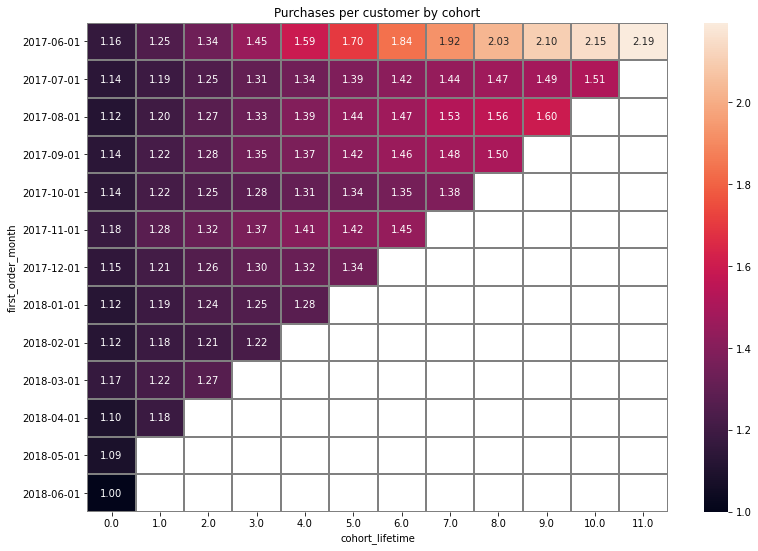

In [48]:
#set heatmap size and title
plt.figure(figsize=(13, 9))
plt.title('Purchases per customer by cohort')

#change index annotation to a nicer format
cohort_pivot.index=cohort_pivot.index.astype(str)
#plot a heatmap
sns.heatmap(
    cohort_pivot,
    annot=True,
    fmt='.2f',
    linewidths=1,
    linecolor='gray',
)
plt.show()

Key insights:
1. Purchases per customer varies from 1 to 2.2, purchases per customer tend to increase in the winter months, expecially for the oldest cohorts (June 2017 - Sep 2017). 


2. Customers from the first cohort have overall more purchases per customer than other cohorts, especially in the winter months.


3. In most cohorts, purchases per customer increases steadily overtime.

**What is the average purchase size?:**

First let's calculate the overall average purchase size, then we'll go further with our analysis.

In [49]:
print('The average purchase size of customers at Yandex.Afisha is {:.1f}'.format(purchases['revenue'].mean()))

The average purchase size of customers at Yandex.Afisha is 5.0


Let's plot a bar graph to demonstrate the daily average purchase size of customers overtime:

In [50]:
avg_daily_purchase = purchases.groupby(['date_purchase'])['revenue'].mean().reset_index()
avg_daily_purchase.columns = ['date','avg_purchase']

In [51]:
#create a line plot using plotly.express
fig = px.line(avg_daily_purchase, x='date', y='avg_purchase',
              labels={
                  'date': 'Date',
                  'avg_purchase': 'Average Purchase size'
              },title='Daily Average Purchase Size')
fig.show()

For the most part, daily average purchase size hover around 3-6 values with peaks above 10, those peaks can be contributed to significant sales discount or the opening sales of big events that got a lot of people attention.

Now, let's get more in-depth with our analysis and look at the average purchase size by cohorts:

In [52]:
#create cohorts based on months and calculate average purchase size for each cohort lifetime
avg_cohort = purchases.groupby(['first_order_month','month_purchase'])['revenue'].mean().reset_index()
avg_cohort['cohort_lifetime'] = ((avg_cohort['month_purchase'] - avg_cohort['first_order_month']) / 
                               np.timedelta64(1,'M')).round()
avg_cohort.head()

,first_order_month,month_purchase,revenue,cohort_lifetime
0,2017-06-01,2017-06-01,4.060106,0.0
1,2017-06-01,2017-07-01,5.547006,1.0
2,2017-06-01,2017-08-01,5.088161,2.0
3,2017-06-01,2017-09-01,8.545575,3.0
4,2017-06-01,2017-10-01,7.084178,4.0


Next, we'll create a pivot table with the aggregated data on the cohort and visualize the information with heatmap:

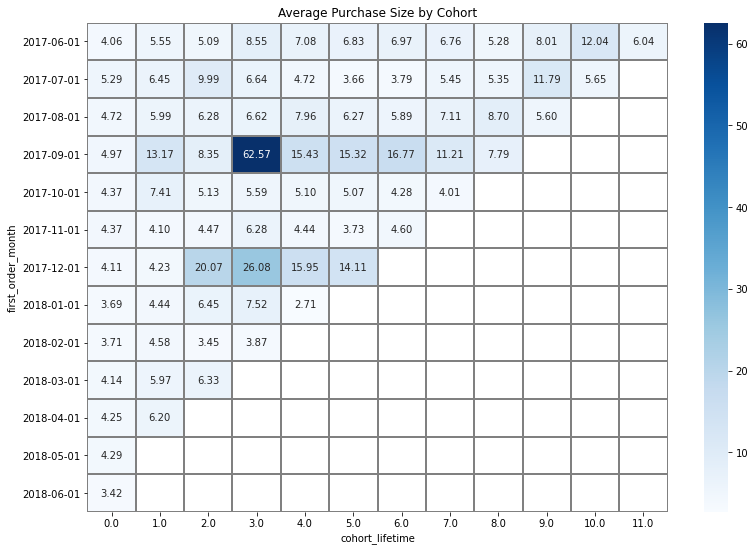

In [53]:
#create a pivot table for 
avg_cohort_pivot = avg_cohort.pivot_table(
    index='first_order_month', 
    columns='cohort_lifetime', 
    values='revenue', 
    aggfunc='mean'
)
avg_cohort_pivot.round(2).fillna('')

#visualize with heatmap
#set heatmap size and title
plt.figure(figsize=(13, 9))
plt.title('Average Purchase Size by Cohort')

#change index annotation to a nicer format
avg_cohort_pivot.index = avg_cohort_pivot.index.astype(str)
#plot a heatmap
sns.heatmap(
    avg_cohort_pivot,
    cmap='Blues',
    annot=True,
    fmt='.2f',
    linewidths=1,
    linecolor='gray',
)
plt.show()

The September and December cohorts stand out from the crowd as they spent more on average than the other cohorts.

Let's take a look at the overall monthly average purchase size(without regard to cohorts, simply the average of each month)

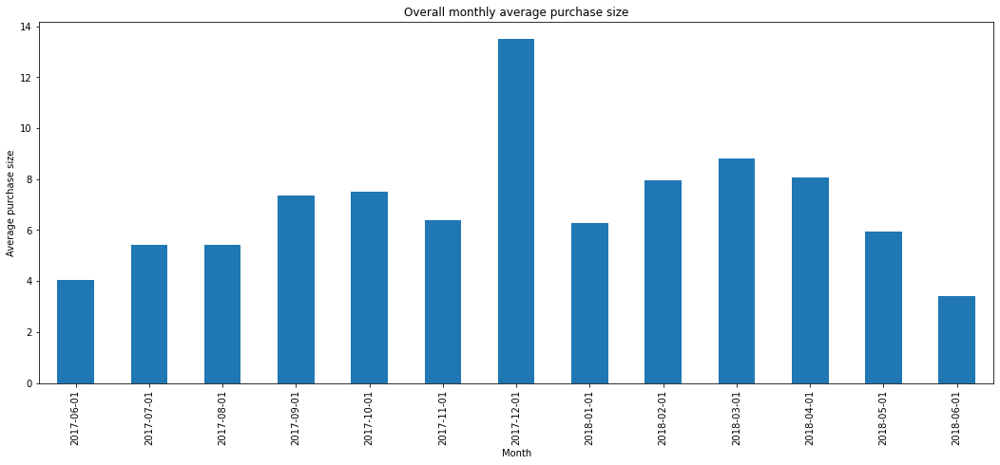

In [54]:
monthly_avg_purchase = avg_cohort.groupby('month_purchase')['revenue'].mean()

#change index annotation to a nicer format
monthly_avg_purchase.index = monthly_avg_purchase.index.astype(str)

monthly_avg_purchase.plot(kind='bar', figsize=(18,7))
#set title and x/y labels
plt.gca().set(title="Overall monthly average purchase size", xlabel='Month', ylabel='Average purchase size')
plt.show()

The main points of interest we can draw from the graph are:
- December has the highest value of average purchase size by a big margin, almost 14 average purchase size.
- June 2018 has the lowest value of average purchase size.

Overall, combined with the heatmap we created before for our cohort analysis, we can notice the big average purchase size in September and December cohorts (Sep cohort 3rd lifetime: 62.57 and Dec cohort 2nd & 3rd lifetimes: 20.07 and 26.08, respectively) pulled up the average of the suitable months in the bar chart above.

Notice that December, February, and March have high average values, the cohort's purchases we mentioned before definitely affected the overall average of those months.

**How much money do they bring? (LTV):**

Here we're interested in our customers lifetime value, we'll calculate the revenue per customer, we consider the revenue in the data as gross profit so the margin rate equal 1.

In [55]:
#get the revenue per cohort in each month
ltv_cohort = purchases.groupby(['first_order_month','month_purchase'])['revenue'].sum().reset_index()
ltv_cohort.columns = ['first_order_month','month','revenue']

#merge with the cohort size df we made earlier
ltv_cohort = ltv_cohort.merge(cohort_sizes, on=['first_order_month'])
#calculate cohort lifetime
ltv_cohort['cohort_lifetime'] = ((ltv_cohort['month'] - ltv_cohort['first_order_month']) / np.timedelta64(1,'M')).round()
ltv_cohort['ltv'] = ltv_cohort['revenue'] / ltv_cohort['cohort_size']

As we've done before, we'll aggregate the data in a pivot table and then visualize the result with heatmap plot:

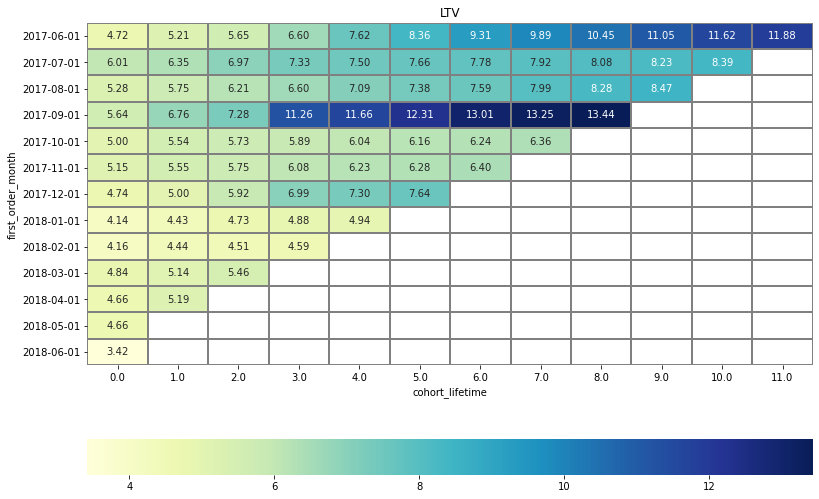

In [56]:
#create a pivot table with LTV values, since LTV is a cumulative metric we use cumsum() method here
ltv_cohort_pivot = ltv_cohort.pivot_table(
    index='first_order_month', 
    columns='cohort_lifetime', 
    values='ltv', 
    aggfunc='sum'
).cumsum(axis=1)

#change index annotation to a nicer format
ltv_cohort_pivot.index = ltv_cohort_pivot.index.astype(str)

#set heatmap size and title
plt.figure(figsize=(13, 9))
plt.title('Average Purchase Size by Cohort')

#plot a heatmap
sns.heatmap(ltv_cohort_pivot, cmap="YlGnBu", annot=True, fmt='.2f', linewidths=1, 
            linecolor='grey', cbar_kws= {'orientation': 'horizontal'} 
            ).set(title ='LTV')
plt.show()

The first 4 cohorts, June 2017 - Sep 2017 appear as the more profitable cohorts over time, especially the June and September cohorts with the latter we can notice the highest LTV values.

Again, as with the purchases per customer we can notice the effect seasonality have on LTV values for the older cohorts we mentioned before, during the winter months the first cohorts shown significant increase in LTV values.

On the other hand, cohorts Jan-Feb are the least profitable from the bunch and the following cohorts are not doing much better.


### Marketing

<a class="anchor" id="marketing"></a>
[Go back to the Table of Contents](#table_of_contents)

**How much money was spent? Overall/per source/over time:**

First, let's sort the costs table which holds the data for marketing costs by date and source:

In [57]:
#sort costs df by date and source_id
costs = costs.sort_values(by=['dt','source_id']).reset_index(drop=True)

Now, let's find the total marketing costs for the entire period:

In [58]:
print('Total marketing cost of Yandex.Afisha from June 2017 to June 2018 is {}'.format(costs['costs'].sum()))

Total marketing cost of Yandex.Afisha from June 2017 to June 2018 is 329131.62


Next, let's see how marketing costs varies for different sources:

In [59]:
marketing_per_source = costs.groupby(['source_id'])['costs'].sum().sort_values(ascending=False).reset_index()
#calculate each source share of the total marketing cost
marketing_per_source['share'] = (marketing_per_source['costs'] / costs['costs'].sum()) * 100
marketing_per_source

,source_id,costs,share
0,3,141321.63,42.937725
1,4,61073.60,18.555981
2,5,51757.10,15.725350
3,2,42806.04,13.005751
4,1,20833.27,6.329769
5,10,5822.49,1.769046
6,9,5517.49,1.676378


In the table above we can see the cost of each marketing source and their share of the total cost:
1. Source number 3 lead in terms of costs with a share of almost 43% of the marketing budget.
2. Sources 4, 5, and 2 follow the lead with share of 13%-18% of marketing budget.
3. Source 1 has 6.3% share and sources 10 and 9 have the lowest share of less than 2% for each of them.

Let's visualize the marketing costs by different sources overtime:

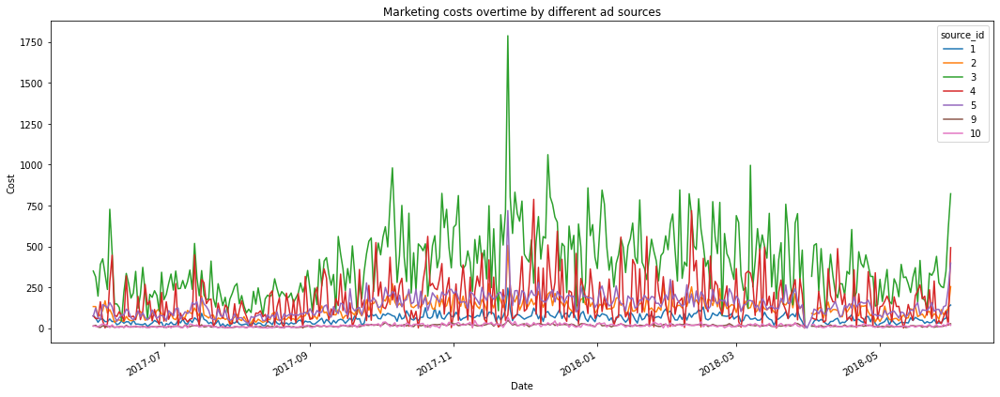

In [60]:
#create pivot table out of costs df
costs_pivot = pd.pivot_table(costs, index='dt', columns='source_id', values='costs')

#lineplot
costs_pivot.plot(figsize=(18,7))
#set title and x/y labels
plt.gca().set(title="Marketing costs overtime by different ad sources", xlabel='Date', ylabel='Cost')
plt.show()

Here in the graph we can see the differences between sources overtime, source number 3 lead by a big margin for the most of the year, notice the peak at 24 Nov, 2017.

Let's recall the DAU graph we made earlier in the project we saw a peak of active user at the same day, from a quick search online we know this date was the 'Black Friday' of 2017 which explains why the marketing costs was the highest at this date and because of that we saw the spike in active users at the same date.

Overall, we see the general trend of seasonality we noticed in earlier stages of the project, in the winter (October to March) marketing costs was higher across all sources. During the June to September period we notice the lowest amount of money spent on marketing.

**How much did customer acquisition from each of the sources cost?:**

Here we're interested in CAC, similar to how we operated before we'll find the overall costs for each month in the data, how many customers we were able to aquire during those months, and then simply calculate how much on average each customer costs us.

Let's find the marketing costs for each month:

In [61]:
#create month column for costs
costs['month'] = costs['dt'].astype('datetime64[M]')
#aggregate sum of costs by month
costs_per_month = costs.groupby(['month'])['costs'].sum().reset_index()
#print first 5 rows
costs_per_month.head()

,month,costs
0,2017-06-01,18015.00
1,2017-07-01,18240.59
2,2017-08-01,14790.54
3,2017-09-01,24368.91
4,2017-10-01,36322.88


Now we'll find the number of new customers each month:

In [62]:
#group unique customers by month
customers_per_month = purchases.groupby(['first_order_month'])['uid'].nunique().reset_index()
customers_per_month.columns = ['month','n_customers']
customers_per_month.head()

,month,n_customers
0,2017-06-01,2023
1,2017-07-01,1923
2,2017-08-01,1370
3,2017-09-01,2581
4,2017-10-01,4340


Now we can merge 'costs_per_month' with 'customers_per_month' and calculate the CAC values for each month:

In [63]:
#merge costs and customers_per_month df
cac_per_month = costs_per_month.merge(customers_per_month, how='left', on=['month'])
#calculate cac according to known formula
cac_per_month['cac'] = cac_per_month['costs'] / cac_per_month['n_customers']
#print first 5 rows of the new df
cac_per_month

,month,costs,n_customers,cac
0,2017-06-01,18015.00,2023,8.905091
1,2017-07-01,18240.59,1923,9.485486
2,2017-08-01,14790.54,1370,10.796015
3,2017-09-01,24368.91,2581,9.441654
4,2017-10-01,36322.88,4340,8.369327
5,2017-11-01,37907.88,4081,9.288870
6,2017-12-01,38315.35,4383,8.741809
7,2018-01-01,33518.52,3373,9.937302
8,2018-02-01,32723.03,3651,8.962758
9,2018-03-01,30415.27,3533,8.608907


In [64]:
fig = px.line(cac_per_month, x="month", y="cac", title='CAC')
fig.show()

From the chart above we deduce that August had the highest value of CAC, with the information from the cac_per_month df we can see that the lowest number of customers were aquired that month so that fact increased the CAC value of August.

As with the general tendency of our analysis, the October-March(Winter) period was the most successful in terms of customers acquiring but in terms of CAC values, in this period the overall costs and number of new customers were the highest but, in terms of CAC, other than August, we don't see a big differences in CAC values between different months.

*Let's calculate CAC values by different ad sources:*

For this purpose we'll need data from the visits df, for each user we'll find the first ad source he came from (users can come from multiple sources if they have more than 1 visit).

In [65]:
#find the first source user came from
first_source = visits.sort_values('date_visit').groupby('uid').first()['source_id'].reset_index()
first_source.columns=['uid','first_source']

Now we'll merge purchases and first_source to get data only on customers:

In [66]:
purchases = purchases.merge(first_source, how='left', on=['uid'])
purchases.head()

,buy_ts,revenue,uid,month_purchase,week_purchase,date_purchase,first_order,first_visit,conversion,first_order_month,first_source
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-06-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01,0,2017-06-01,1
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-06-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01,0,2017-06-01,2
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-06-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01,0,2017-06-01,2
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-06-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01,0,2017-06-01,2
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-06-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01,0,2017-06-01,3


Next, we'll simply repeat the steps we took to find the CAC values by months only now we'll pay attention to the source as well.

In [67]:
#aggregate marketing costs by month and source
costs_per_month_source = costs.groupby(['month','source_id'])['costs'].sum().reset_index()

#aggregate number of uniaue customers by month cohort and source
customers_per_month_source = purchases.groupby(['first_order_month','first_source'])['uid'].nunique().reset_index()
customers_per_month_source.columns=['month','source_id','n_customers']

#calculate CAC based on month and source
cac_per_month_source = costs_per_month_source.merge(customers_per_month_source, how='left', on=['month','source_id'])
cac_per_month_source['cac'] = cac_per_month_source['costs'] / cac_per_month_source['n_customers']
cac_per_month_source.head()

,month,source_id,costs,n_customers,cac
0,2017-06-01,1,1125.61,218,5.163349
1,2017-06-01,2,2427.38,236,10.285508
2,2017-06-01,3,7731.65,618,12.510761
3,2017-06-01,4,3514.80,401,8.765087
4,2017-06-01,5,2616.12,390,6.708000


In [68]:
#plotting cac dynamics
fig = px.line(cac_per_month_source, x="month", y="cac",color='source_id',title='CAC by Source')
fig.show()

Let's calculate the overall average CAC value for each source and compare it with the overtime values we see in the chart above.

In [69]:
for i in [1,2,3,4,5,9,10]:
    print('The CAC average of source {} is {}'.format(i,
                                cac_per_month_source[cac_per_month_source['source_id'] == i]['cac'].mean()))

The CAC average of source 1 is 6.199414760855388
The CAC average of source 2 is 12.326715197281308
The CAC average of source 3 is 14.281640141355354
The CAC average of source 4 is 6.6385937518081235
The CAC average of source 5 is 7.268826851748994
The CAC average of source 9 is 5.564656224031487
The CAC average of source 10 is 4.969575101008743


Insights:
1. Sources 3 and 2 have the highest average CAC values, in August the month we mentioned earlier as the period where the least amount of users became customers we see CAC values higher than their average for both sources. Also for both of these sources the CAC values in May 2018 were significantly lower than the matching average for each source.

2. Source number 1 seems to be the most steady source in terms of CAC values, in each month the CAC value is relatively close to the source average.

3. Source number 10 show great variability in terms of CAC value, there are noticeable differences in CAC values between months for this source, also this source has the lowest average CAC value.

4. Overall it's hard to notice any trend for all sources.

**How worthwhile where the investments? (ROI):**

Here we are interested in ROI values which in this case particular case is identical to ROMI.
We'll calculate the ROI from two different angles:
1. Based on month cohorts.
2. Based on source.

We'll start with the first one(cohorts):

First, let's recall the formula for ROI: ROI = LTV / CAC.

So we already calculated LTV and CAC values, let's merge them into a single df and calculate the ROI.

In [70]:
cac_per_month_roi = cac_per_month[['month','cac']]
cac_per_month_roi.columns = ['first_order_month','cac']

roi = ltv_cohort.merge(cac_per_month_roi, on=['first_order_month'], how='left')
roi.head()

,first_order_month,month,revenue,cohort_size,cohort_lifetime,ltv,cac
0,2017-06-01,2017-06-01,9557.49,2023,0.0,4.724414,8.905091
1,2017-06-01,2017-07-01,981.82,2023,1.0,0.485329,8.905091
2,2017-06-01,2017-08-01,885.34,2023,2.0,0.437637,8.905091
3,2017-06-01,2017-09-01,1931.30,2023,3.0,0.954671,8.905091
4,2017-06-01,2017-10-01,2068.58,2023,4.0,1.022531,8.905091


Now, let's aggregate the data in a pivot table and visualize the ROI values by monthly cohorts:

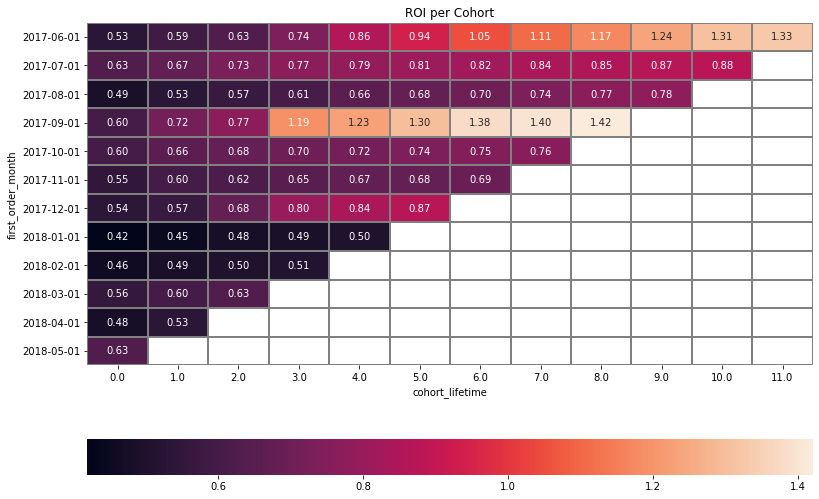

In [71]:
#calculate roi according to formula
roi['roi'] = roi['ltv'] / roi['cac']

#in a pivot table, aggregate roi values by monthly cohort
roi_pivot = roi.pivot_table(
    index='first_order_month', columns='cohort_lifetime', values='roi', aggfunc='mean'
).cumsum(axis=1).round(2) 

#set heatmap size and title
plt.figure(figsize=(13, 9))
plt.title('ROI per Cohort')

#change index annotation to a nicer format
roi_pivot.index = roi_pivot.index.astype(str)
#plot a heatmap
sns.heatmap(roi_pivot, annot=True, fmt='.2f', linewidths=1, linecolor='grey', cbar_kws= {'orientation': 'horizontal'} 
            )
plt.show()

Insights:
1. Only two cohorts became profitable overtime.


2. The June cohort became profitable in the 6th lifetime cohort and continued to be profitable from there.


3. The September cohort became profitable in the 3rd lifetime cohort and continued to be profitable from there, also if we compare it to the June cohort, here the ROI values are slightly higher and this cohort became profitable 3 months earlier.


4. Similar story to the LTV values, The Jan - May cohorts show a smaller ROI values than the cohorts before them.

In [72]:
#you create this table
display(roi.head())

,first_order_month,month,revenue,cohort_size,cohort_lifetime,ltv,cac,roi
0,2017-06-01,2017-06-01,9557.49,2023,0.0,4.724414,8.905091,0.530530
1,2017-06-01,2017-07-01,981.82,2023,1.0,0.485329,8.905091,0.054500
2,2017-06-01,2017-08-01,885.34,2023,2.0,0.437637,8.905091,0.049145
3,2017-06-01,2017-09-01,1931.30,2023,3.0,0.954671,8.905091,0.107205
4,2017-06-01,2017-10-01,2068.58,2023,4.0,1.022531,8.905091,0.114825


Now, we'll repeat the stages we took for our cohort analysis with ROI, but now cohorts will be divided by first month order and source.

In [73]:
#define cohort size using the month of first purchase and source
cohort_source_sizes = purchases.groupby(['first_order_month', 'first_source']).agg({'uid': 'nunique'}).reset_index()
cohort_source_sizes.columns=['first_order_month', 'source','cohort_size']
cohort_source_sizes.head()

,first_order_month,source,cohort_size
0,2017-06-01,1,218
1,2017-06-01,2,236
2,2017-06-01,3,618
3,2017-06-01,4,401
4,2017-06-01,5,390


In [74]:
#get the revenue per cohort and per source in each month
ltv_source_cohort = purchases.groupby(['first_order_month','month_purchase', 'first_source'])['revenue'].sum().reset_index()
ltv_source_cohort.columns = ['first_order_month','month', 'source','revenue']

#merge with the cohort size df we made earlier
ltv_source_cohort = pd.merge(ltv_source_cohort, cohort_source_sizes, on=['first_order_month', 'source'])
#calculate cohort lifetime
ltv_source_cohort['cohort_lifetime'] = ((ltv_source_cohort['month'] - ltv_source_cohort['first_order_month']) / np.timedelta64(1,'M')).round()
ltv_source_cohort['ltv'] = ltv_source_cohort['revenue'] / ltv_source_cohort['cohort_size']
ltv_source_cohort.head()

,first_order_month,month,source,revenue,cohort_size,cohort_lifetime,ltv
0,2017-06-01,2017-06-01,1,1476.75,218,0.0,6.774083
1,2017-06-01,2017-07-01,1,313.28,218,1.0,1.437064
2,2017-06-01,2017-08-01,1,397.13,218,2.0,1.821697
3,2017-06-01,2017-09-01,1,682.56,218,3.0,3.131009
4,2017-06-01,2017-10-01,1,434.95,218,4.0,1.995183


In [75]:
#create a table with cac values for each month and source
cac_per_month_source_roi = cac_per_month_source[['month', 'source_id','cac']]
cac_per_month_source_roi.columns = ['first_order_month', 'source','cac']

#merge the data frames with info about CAC and LTV value for monthly cohorts for each source
roi_month_source = pd.merge(ltv_source_cohort, cac_per_month_source_roi, on=['first_order_month', 'source'])
#calculate roi according to formula
roi_month_source['roi'] = roi_month_source['ltv'] / roi_month_source['cac']
roi_month_source.head()

,first_order_month,month,source,revenue,cohort_size,cohort_lifetime,ltv,cac,roi
0,2017-06-01,2017-06-01,1,1476.75,218,0.0,6.774083,5.163349,1.311955
1,2017-06-01,2017-07-01,1,313.28,218,1.0,1.437064,5.163349,0.278320
2,2017-06-01,2017-08-01,1,397.13,218,2.0,1.821697,5.163349,0.352813
3,2017-06-01,2017-09-01,1,682.56,218,3.0,3.131009,5.163349,0.606391
4,2017-06-01,2017-10-01,1,434.95,218,4.0,1.995183,5.163349,0.386413


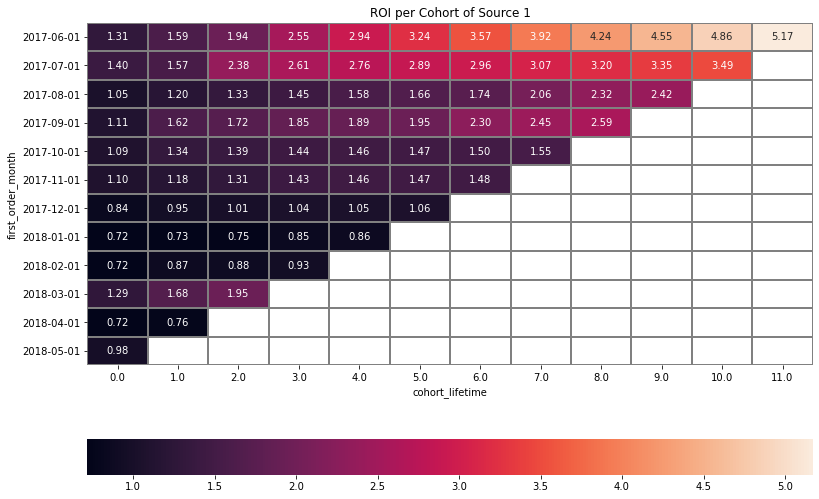

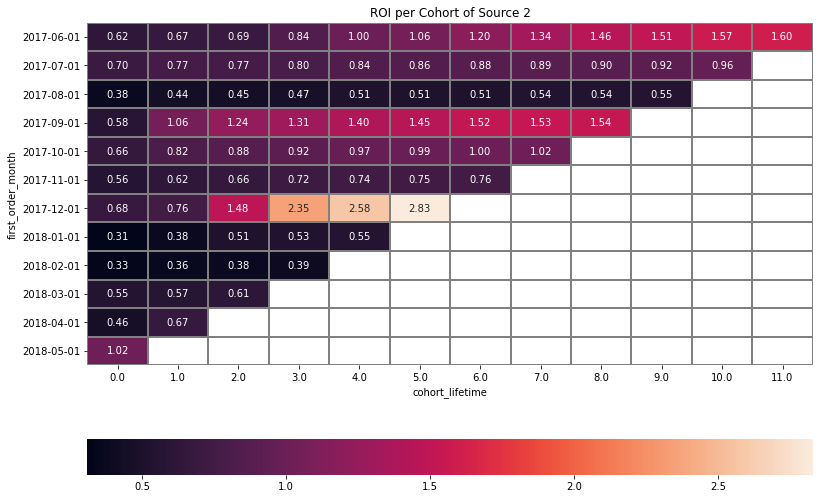

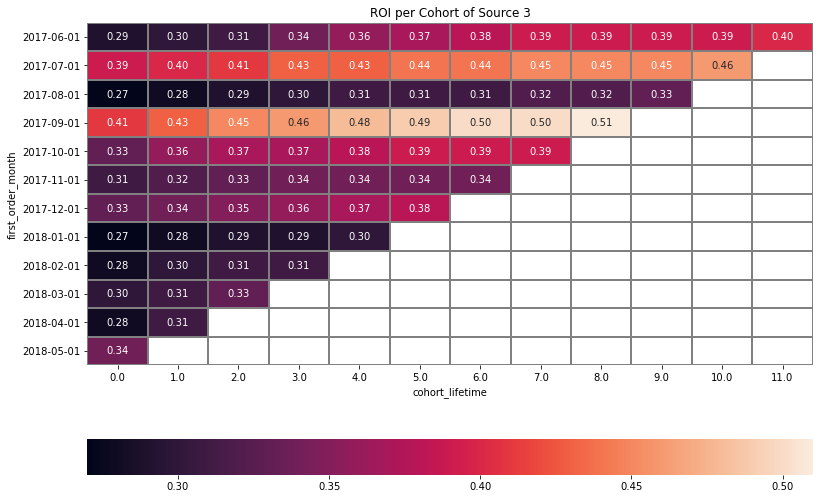

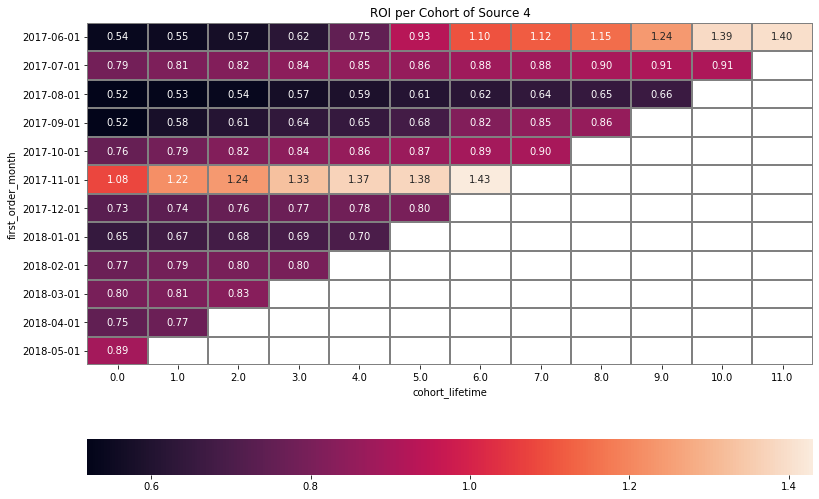

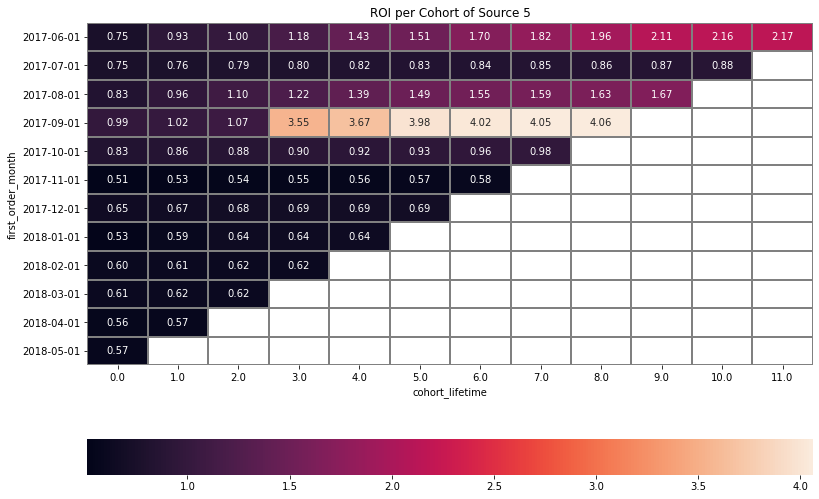

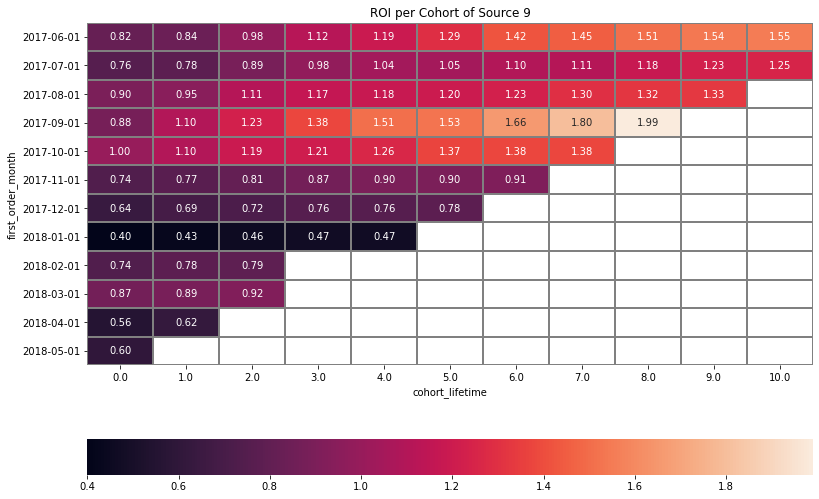

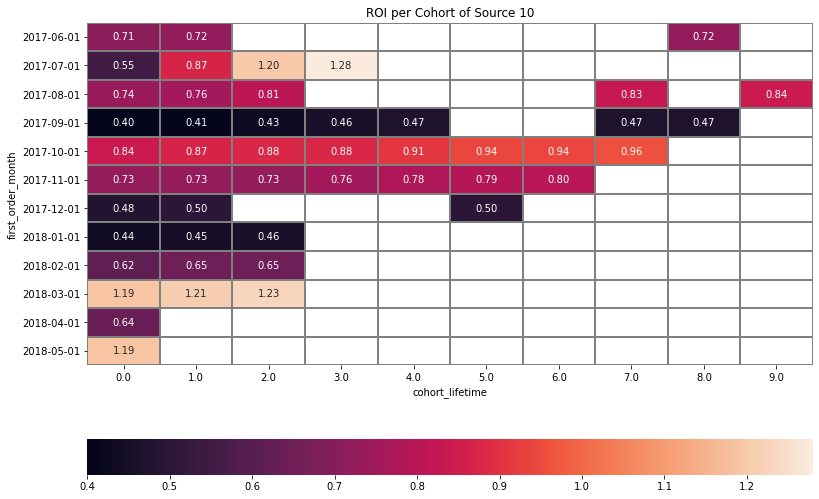

In [76]:
for i in [1,2,3,4,5,9,10]:
    #in a pivot table, aggregate roi values by monthly cohort
    roi_month_source_pivot = roi_month_source.query('source == @i').pivot_table(
        index='first_order_month', columns='cohort_lifetime', values='roi', aggfunc='mean'
    ).cumsum(axis=1).round(2) 

    #set heatmap size and title
    plt.figure(figsize=(13, 9))
    plt.title('ROI per Cohort of Source {}'.format(i))

    #change index annotation to a nicer format
    roi_month_source_pivot.index = roi_month_source_pivot.index.astype(str)
    #plot a heatmap
    sns.heatmap(roi_month_source_pivot, annot=True, fmt='.2f', linewidths=1, linecolor='grey', cbar_kws= {'orientation': 'horizontal'} 
            )
    plt.show()

Wow, a lot of information to take, let's try to sum it up.

Overall there are numerous similarities between the overall ROI we did earlier to the ones divided by source, June and September cohorts have good ROI values in most sources.

Conclusions:
- Source 1 is by far the best source in terms of ROI values, 7 cohorts were profitable right off the bat, in the first month! The other cohorts became profitable/almost profitable through the year.

- Source 2 had decent results, cohorts June, Sep, Oct, and Dec became profitable.

- Source 3 is by far the worst source in terms of ROI values, not a single cohort became profitable and most of them didn't even pass the 0.5 ROI value mark.

- Sources 4 and 5 are OK, not the best results but some cohorts did become profitable in those sources.

- Source 9 did great at the first cohorts (June-Oct) but later in the year it fell off and the following cohorts were not profitable.

- Source 10 wasn't used throughout the whole year, and the results are not clear.


Next, our second angle we want to analyze, the ROI by sources only:

First we'll calculate the LTV by source.

In [77]:
ltv_source_cohort.head()

,first_order_month,month,source,revenue,cohort_size,cohort_lifetime,ltv
0,2017-06-01,2017-06-01,1,1476.75,218,0.0,6.774083
1,2017-06-01,2017-07-01,1,313.28,218,1.0,1.437064
2,2017-06-01,2017-08-01,1,397.13,218,2.0,1.821697
3,2017-06-01,2017-09-01,1,682.56,218,3.0,3.131009
4,2017-06-01,2017-10-01,1,434.95,218,4.0,1.995183


In [78]:
#group number of unique customers and sum of revenue by source
ltv_per_source = purchases.groupby(['first_source'])['uid','revenue'].agg({'uid':'nunique', 'revenue':'sum'}).reset_index()
ltv_per_source.columns = ['source_id', 'n_customers', 'revenue']
#calculate LTV values
ltv_per_source['ltv'] = ltv_per_source['revenue'] / ltv_per_source['n_customers']
#print ltv values by source sorted in descending order
ltv_per_source.sort_values(by='ltv', ascending=False)

<ipython-input-78-4b3d39416359>:2: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



,source_id,n_customers,revenue,ltv
1,2,3557,45721.66,12.853995
0,1,3383,35529.84,10.502465
4,5,7104,54478.15,7.668659
3,4,9996,55009.80,5.503181
6,9,1060,5536.96,5.223547
2,3,10121,51183.42,5.057150
7,10,1301,4596.15,3.532782
5,7,1,1.22,1.220000


Calculate the CAC and ROI per source values, later we'll visualize it with bar plot.

In [79]:
marketing_per_source

,source_id,costs,share
0,3,141321.63,42.937725
1,4,61073.60,18.555981
2,5,51757.10,15.725350
3,2,42806.04,13.005751
4,1,20833.27,6.329769
5,10,5822.49,1.769046
6,9,5517.49,1.676378


In [80]:
#merge df with info about marketing costs by source and df with LTV values by source
roi_per_source = marketing_per_source.merge(ltv_per_source, on=['source_id'])
#calculate CAC
roi_per_source['cac'] = roi_per_source['costs'] / roi_per_source['n_customers']
#calculate ROI
roi_per_source['roi'] = roi_per_source['ltv'] / roi_per_source['cac']
#print ROI values by source sorted in descending order
roi_per_source.sort_values(by='roi', ascending=False)

,source_id,costs,share,n_customers,revenue,ltv,cac,roi
4,1,20833.27,6.329769,3383,35529.84,10.502465,6.158223,1.705438
3,2,42806.04,13.005751,3557,45721.66,12.853995,12.034310,1.068112
2,5,51757.10,15.725350,7104,54478.15,7.668659,7.285628,1.052573
6,9,5517.49,1.676378,1060,5536.96,5.223547,5.205179,1.003529
1,4,61073.60,18.555981,9996,55009.80,5.503181,6.109804,0.900713
5,10,5822.49,1.769046,1301,4596.15,3.532782,4.475396,0.789379
0,3,141321.63,42.937725,10121,51183.42,5.057150,13.963208,0.362177


Let's visualize ROI per source:

In [81]:
fig = px.bar(roi_per_source, x='source_id', y='roi', title='ROI by Source')
fig.update_xaxes(type='category')
#sort the bars in ascending order
fig.update_layout(xaxis={'categoryorder':'total ascending'})
fig.show()

Insights:
1. Surprisingly, source 3 has the lowest ROI value by a big margin, even though the largest proportion of the marketing budget was invested in this source it's the least profitable ad source by far(actually this source make losses to the company).

2. Sources 10 and 4 are not profitable as well, here the situatuion isn't as extreme with source 3.

3. Sources 9, 5, and 2 are profitable but not by a lot(up to 106% ROI).

4. Source number 1, our winner by a mile, this source had 170% ROI and more marketing budget should flow to this ad source over the rest of the sources. 

## Conclusion & Recommendations

<a class="anchor" id="reco"></a>
[Go back to the Table of Contents](#table_of_contents)

To conclude, at first we loaded the data files in an optimized way into suitable variables:

- 'Device' column in the visits data frame was converted to 'category' data type as there is a limited number of unique values in the column.
- Columns that represent dates values in every data frame were converted to DateTime datatype.

This step allowed us to save space in terms of memory usage and convert columns to the correct data types for analysis in further stages.

Next, we took a general look at the data frames using head() method, we discovered that some columns names in visits and orders data frames contain uppercase letters and spaces, as we know this is a bad practice, we changed these columns names to lowercase letters and replaced space with an underscore to comply with python programming conventions.

We didn't find any missing values/duplicates in any of the data frames.

Lastly, we made new columns for visits and orders data frames that represent the month, week, and date(without hours/minutes/seconds) for each visit/order. This step will allow us to do cohort analysis in further stages.

Now, we arrived to the interesting part, the reports and calculations of metrics for different aspects of the app.

We divided this step into 3 stages, in each stage we answered business-related questions, calculated suitable metrics, and visualized our findings.

The following aspects of the app are the following: Product, Sales, and Marketing.

Let's discuss our findings for each of these aspects.

#### Product:

At first, we wanted to get an idea of **how many people use our app every day/week/month.**
Before we dive deep into the analysis, here are the basic statistical parameters we got:
- DAU: The mean and median of daily active users are 907 and 921, respectively.

- WAU: The mean and median of weekly active users are 5,724 and 5,894, respectively.

- MAU: The mean and median of monthly active users are 23,228 and 24,240, respectively.

From the analysis of DAU/WAU/MAU we arrived to the following conclusions:

- From June to September we can notice a relatively small number of active users compared to the following months.

- The period From October to March can be addressed as the 'busier dates' where the number of active users is above the average, notice the peak on Nov 24, 2017 (DAU graph), this is the 'Black Friday' of 2017 which means we probably had some kind of discounts/special events and we managed to attract more visitors to our app this day.

- Towards the end of March and afterward, we can notice a decrease in the number of active users.

- On March 31, 2018, we had only 1 active user, definitely strange, perhaps on this particular date, something went wrong with the app, probably a technical issue that prevented from users using the app.

Overall it seems like seasonality significantly affects the number of active users, in the winter people tend to spend more time in indoor activities as opposed to the summer when they tend to prefer outdoor activities, moreover, in the winter we have the holiday season, people have more free time and they are more likely to spend time at activities like watching movies/go to a show, etc.

Next, we calculated **how many sessions are there per day**.
Here are the key points of our answer to this question:
- Sessions per user in a day varies between 1 to 2 visits.

- The graph of the distribution of sessions per day acts the same way as the DAU graph.

- Overall, because of the nature of the app(Sales of events tickets), people tend to not visit the app more than once a day, perhaps some system of push notifications can intrigue people's interest and thus get more sessions per day.

Later, we calculated the **length of each session**.
Using describe() method we noticed some anomalies so we plotted a histogram to examine the distribution of sessions length by device, we found out that a significant part of sessions made from the desktop app had a duration of more than 30-50 minutes, some even exceeded the 300+ minutes mark.

These extreme values of session duration are all from a 'desktop' device, perhaps some users left their computers unattended for hours with their browser open on the app so the session length recorded by the app is significantly longer than the actual session duration.

Anyway, after we cleaned those outliers by filtering the data we arrived to the following conclusions:

- The majority of users use the desktop app, other than that the distribution of desktop and touch devices is similar.

- The distribution of session duration in minutes is heavily right-skewed.

- The vast majority of sessions durations are less than 10 minutes.

- It's safe to say that in most cases user's session length won't pass the 5-minute mark.

- No significant differences were found between months in terms of average session duration time.

Next, we wanted to examine our retention rate, meaning **how often do users come back**. 

Since our data consists of data of a whole year, we decided the smartest approach to examine retention rate is by splitting our users into monthly cohorts.

Here are the key insights of our cohort analysis:

- In all of the cohorts we see a drastic drop in terms of user activity after the first month (from 100% to 0%-8%), for most cohorts, in the following cohort's lifetimes retention rate is decreasing over time.


- The first cohort has better retention rates over time when compared to the other cohorts.


- If we look carefully, we can notice the effect seasonality had on retention rate, earlier we said that the period of October - March had more active users than the rest of the time. We can notice this trend here with retention rate, the cohorts before the holiday season/winter had relatively high retention rates in the winter compared to other cohorts.

Overall when we look at the numbers, the retention rates for all cohorts are quite low.

#### Sales:

At first, we were interested in **when do people start buying**, in simpler terms we wanted to know the conversion rate from visit to order.

Here are our findings:

- The overall conversion is 16%.

- The vast majority of users buy a product for the first time within 2 days after their first visit.

- A very small portion of users ordered for the first time more than 9 days after their first visit.

Second, we examined **how many orders users made during a given period**. Again we divided our data into monthly cohorts and calculated the number of orders per user for each cohort and each cohort lifetime.

Key insights from this analysis:

1. Purchases per customer vary from 1 to 2.2, purchases per customer tend to increase in the winter months, especially for the oldest cohorts (June 2017 - Sep 2017). 


2. Customers from the first cohort have overall more purchases per customer than other cohorts, especially in the winter months.


3. In most cohorts, purchases per customer increase steadily over time.

**The overall average purchase size** of customers at Yandex.Afisha is 5.

More interesting points regarding average purchase size:

- Even though Nov 24, 2017 ('Black Friday') had the largest amount of active users, the average purchase size was below the average (4.17).

- For the most part, the daily average purchase size hovers around 3-6 values with peaks above 10, those peaks can be contributed to significant sales discounts or the opening sales of big events that got a lot of people's attention.

- After some cohort analysis we found out that the Sep and Dec cohorts stood out from the rest of the cohorts in terms of the average purchase size, both reach peaks of 62.57 and 26.08 average purchase in their 3rf lifetime cohort.

Lastly, for the sales department, we calculated the LTV values of our monthly cohorts and arrived to the following:

- The first 4 cohorts, June 2017 - Sep 2017 appear as the more profitable cohorts over time, especially the June and September cohorts with the latter we can notice the highest LTV values.

- Again, as with the purchases per customer, we can notice the effect seasonality has on LTV values for the older cohorts we mentioned before, during the winter months the first cohorts shown a significant increase in LTV values.

- On the other hand, cohorts Jan-Feb are the least profitable from the bunch and the following cohorts are not doing much better.

#### Marketing:

At first, we calculated **how much we spent on marketing overall/per ad source/ overtime.**

- Total marketing cost of Yandex.Afisha from June 2017 to June 2018 is 329131.

- Source number 3 leads in terms of costs with a share of almost 43% of the marketing budget.

- Sources 4, 5, and 2 follow the lead with a share of 13%-18% of the marketing budget.

- Source 1 has a 6.3% share and sources 10 and 9 have the lowest share of less than 2% for each of them.

Later we visualized the costs over time and found out:

- On November 24, 2017, a.k.a 'Black Friday' marketing costs reached 1,788 the largest amount for a single day, this could explain the spike we saw on the same day in the DAU graph, unfortunately, we saw earlier that on the same day, average purchase size was lower than the overall average.

In general, we see the overall trend of seasonality we noticed in earlier stages of our work, in the winter (October - March) marketing costs were higher across all sources. During the June - September period we notice the lowest amount of money spent on marketing.

Next, we calculated CAC by ad source values, meaning, **how much did customer acquisition from each of the ad sources cost**.

General insights:

- August had the highest value of CAC(10.8), with the information from the cac_per_month df we can see that the lowest number of customers were acquired that month so that fact increased the CAC value of August.

- As with the general tendency of our analysis, the October-March(Winter) period was the most successful in terms of customers acquiring but in terms of CAC values, in this period the overall costs and number of new customers were the highest but, in terms of CAC, other than August, we don't see a big difference in CAC values between different months.

CAC by Source key takeaways:

- Sources 3 and 2 have the highest average CAC values, in August the month we mentioned earlier as the period where the least amount of users became customers we see CAC values higher than their average for both sources. Also for both of these sources, the CAC values in May 2018 were significantly lower than the matching average for each source.

- Source number 1 seems to be the most steady source in terms of CAC values, in each month the CAC value is relatively close to the source average.

- Source number 10 shows great variability in terms of CAC value, there are noticeable differences in CAC values between months for this source, also this source has the lowest average CAC value.

- Overall it's hard to notice any trend for all sources.

Lastly, we calculated the most important metric of all! (Well, if you are an investor it is). The ROI, We calculated the ROI from two different angles:

- Based on monthly cohorts.
- Based on the source.

*Cohorts:*

- The June cohort became profitable in the 6th-lifetime cohort and continued to be profitable from there.

- The September cohort became profitable in the 3rd-lifetime cohort and continued to be profitable from there, also if we compare it to the June cohort, here the ROI values are slightly higher and this cohort became profitable 3 months earlier.

- Similar story to the LTV values, The Jan - May cohorts show smaller ROI values than the cohorts before them.

*Ad Source:*

- Surprisingly, source 3 has the lowest ROI value by a big margin, even though the largest proportion of the marketing budget was invested in this source it's the least profitable ad source by far(actually this source makes losses to the company).

- Sources 10 and 4 are not profitable as well, here the situation isn't as extreme with source 3.

- Sources 9, 5, and 2 are profitable but not by a lot(up to 106% ROI).

- Source number 1, our winner by a mile, this source had 170% ROI, and more marketing budget should flow to this ad source over the rest of the sources.

This sums up the analysis part, and now for our humble recommendations:

- Drop the marketing investment in ad source number 3 completely, 43% of the marketing budget went to this source which had an ROI of only 36% which is a pretty bad rate compared to the others.

- Ad sources 4(90% ROI) and 10(78% ROI) can be dropped as well, or at least assigned fewer resources in terms of the marketing budget (Source 10 already have less than 2% share of budget but 4 had 18% which is second only to source 3).

- Ad source 1 is the most successful in terms of ROI, we recommend to increase the marketing budget for this channel significantly(at least 50% share) and assign more resources to sources 2, 5, and 9(now is less than 2% share of budget)

- Increase session per day in touch devices by using a system of push notifications to intrigue people's interests, there is unfulfilled potential in the mobile market, examine if there are any technical problems that make it difficult for users to use the app in touch devices.

- 'Black Friday' had the most amount of daily users but a disappointing average purchase size, perhaps marketing and sales strategy for this holiday and others need to be recalibrated to get better results next year.